In [95]:
import os
import glob
import collections
import subprocess as sp
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from operator import itemgetter
from networkx.classes.multidigraph import MultiDiGraph
from networkx.drawing.nx_agraph import read_dot, write_dot, graphviz_layout

import stats
import graphs
import sqlite_helper as helper

In [96]:
# Needs to be done when there are changes in these files ...
import importlib
importlib.reload(helper)
importlib.reload(stats)
importlib.reload(graphs)

<module 'graphs' from '/Users/christopher/Uni/MasterThesis/repositories/masters-thesis/src/graphs.py'>

# Load Tag Data

In [157]:
db_path_201 = "/Users/christopher/Uni/MasterThesis/exp2/withPProf/sqlite-database.db"
db_path_203 = "/Users/christopher/Uni/MasterThesis/exp2/sqlite-database-2-0-3.db"
db_path_205 = "/Users/christopher/Uni/MasterThesis/exp2/sqlite-database-2-0-5.db"

In [158]:
measurements_201 = helper.get_all_measurements(db_path_201)
measurements_203 = helper.get_all_measurements(db_path_203)
measurements_205 = helper.get_all_measurements(db_path_205)

In [159]:
group_201 = helper.group_measurements_by_name(measurements_201, -2)
group_203 = helper.group_measurements_by_name(measurements_203, -2)
group_205 = helper.group_measurements_by_name(measurements_205, -2)

BenchmarkMarshal/SimpleDocument/map [790.1, 784.9, 780.8, 785.4, 788.3, 784.6]
BenchmarkMarshal/SimpleDocument/map [760.0, 761.2, 763.7, 758.2, 758.8, 761.7, 777.5, 767.1, 770.4, 769.1, 774.4, 766.7, 765.7, 762.2, 763.0, 777.7, 768.2, 774.6]
BenchmarkMarshal/SimpleDocument/map [765.7, 791.9, 763.9, 755.0, 762.8, 761.6, 758.5, 760.9, 755.2, 760.3, 1567.0, 756.1, 759.2, 768.4, 757.0, 768.1, 767.1, 757.6]


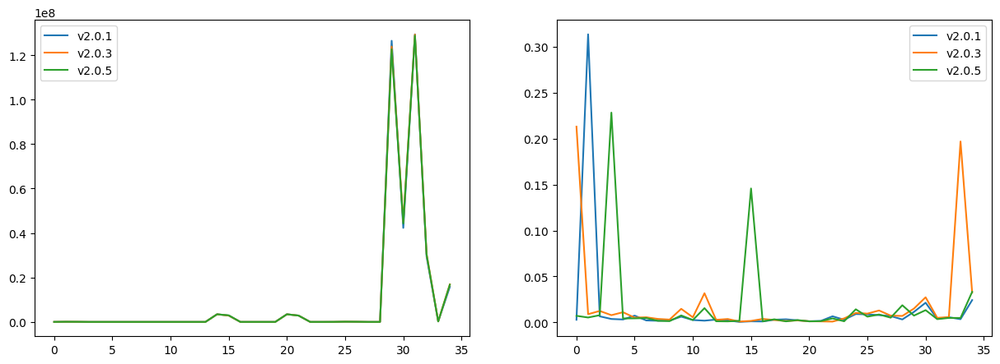

In [235]:
fig, axs = plt.subplots(1, 2,figsize=(15,5))

for tag in [group_201, group_203, group_205]:
    cv = []
    mean = []
    max = []
    od = collections.OrderedDict(sorted(tag.items()))
    for idx, (k, data) in enumerate(od.items()):
        x = []
        for entry in data:
            x.append(entry[2])
        cv.append(stats.cv(x))
        mean.append(np.mean(x))
        max.append(np.max(x))

        if idx == 3:
            print(k, x)

    axs[0].plot(mean, label=data[0][-1])
    axs[1].plot(cv, label=data[0][-1])

axs[0].legend()
axs[1].legend()
plt.show()

In [172]:
od = collections.OrderedDict(sorted(group_203.items()))
for k, v in od.items(): print(k, v)

BenchmarkMarshal/HugoFrontMatter [(205, 102288, 11455.0, 1, 3, 2, 3, 1, 1, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (206, 102176, 11603.0, 1, 3, 2, 3, 1, 2, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (207, 99442, 11464.0, 1, 3, 2, 3, 1, 3, 1, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (208, 101880, 11421.0, 1, 3, 2, 3, 1, 1, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (209, 101330, 11562.0, 1, 3, 2, 3, 1, 2, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (210, 102165, 11532.0, 1, 3, 2, 3, 1, 3, 2, 1, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (415, 100142, 11660.0, 1, 3, 2, 3, 1, 1, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (416, 101732, 11526.0, 1, 3, 2, 3, 1, 2, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (417, 100688, 11655.0, 1, 3, 2, 3, 1, 3, 1, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (418, 101935, 11647.0, 1, 3, 2, 3, 1, 1, 2, 2, 'BenchmarkMarshal/HugoFrontMatter', 'v2.0.3'), (419, 99502, 11527.0, 1, 3,

In [47]:
intersect = set()
for tag in grouped_by_tags.keys():
    group_by_bench = helper.group_measurements_by_name(grouped_by_tags[tag], -2)
    print(group_by_bench.keys())
    if intersect.__len__() == 0:
        intersect = set(group_by_bench.keys())
    else:
        intersect = intersect.intersection(set(group_by_bench.keys()))
print(intersect)


dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
dict_keys(['BenchmarkScanComments/1MValid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkScanComments/1kValid', 'BenchmarkParseLiteralStringValid/10Valid'])
{'BenchmarkScanComments/1MValidUtf8', 'BenchmarkScanComments/1kValidUtf8', 'BenchmarkScanComments/10Valid', 'BenchmarkParseLiteralStringValid/10Valid', 'BenchmarkScanComments/10ValidUtf8', 'BenchmarkSca

# PPROF files

In [97]:
graph_paths0 = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/"
graph_paths1 = "/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/"

In [129]:
def get_name_from_dot(path):
    # Remove last dot, remove last 3 "_" which are hardcoded
    return path.split("/")[-1].rsplit(".", 1)[0].rsplit("_", 3)[0]

In [130]:
get_name_from_dot("05-28-2023_BenchmarkNexts-next__100.000000%_1_1_v1-3-0.dot")

'05-28-2023_BenchmarkNexts-next__100.000000%'

In [102]:
dot_files = []
for graph_paths in [graph_paths0, graph_paths1]:
    # Convert files to dot files for further analysis

    # Clear existing dot files
    for existingDotFile in glob.glob(graph_paths + "*.dot"):
        os.remove(existingDotFile)

    if len(glob.glob(graph_paths + "*.dot")) == 0:
        files = glob.glob(graph_paths + "*")
        for file in files:
            
            if file.endswith(".dot"):
                continue
            
            name = file.split(".out")[0]
            command = f"go tool pprof -nodecount=3000 --nodefraction=0.0 --edgefraction=0.0 -dot {name}.out > {name}.dot"
            stream = os.popen(command)
            output = stream.read()
            

    dot_files.extend(glob.glob(graph_paths + "*.dot"))

/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-3-3_1_1_v1-3-0.out: parsing profile: empty input file
failed to fetch any source profiles
/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-10-3-10_1_1_v1-3-0.out: parsing profile: empty input file
failed to fetch any source profiles
/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-4-3-10_1_1_v1-3-0.out: parsing profile: empty input file
failed to fetch any source profiles
/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-instance-0/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-7-3-10_1_1_v1-3-0.out: parsing profile: empty input file
failed to fetch any source profiles
/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance0/backup-mt-1-inst

In [103]:
len(glob.glob(graph_paths + "*.out"))

210

In [104]:
len(dot_files)

420

In [55]:
glob.glob(graph_paths + "*.dot")

['/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkShortIteratorAdvanceRuntime-init_size_6500_shortIterator_advance_1_1_v1-3-0.dot',
 '/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkChecksum-checksum-compressed-32768_1_1_v1-3-0.dot',
 '/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-10-10_1_1_v1-3-0.dot',
 '/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkSetBitset_1_1_v1-3-0.dot',
 '/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkNexts-nextmany__12.dot',
 '/Users/christopher/Uni/MasterThesis/experiment_4_roaring/instance1/backup-mt-1-instance-1/05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-7-3-10_1_1_v1-3-0.dot',
 '/Users/christopher/Uni/MasterThesis/ex

In [131]:
"""Load and convert all graphs, and generate a unique node mapping."""
count_bad_input = 0
ordered_graphs = {}
for dot_file in dot_files:
    name = get_name_from_dot(dot_file)
    
    try:
        curr_graph = read_dot(dot_file)
        curr_graph = graphs.convertWeigthsToFloat(curr_graph)
    except ValueError: 
        count_bad_input += 1
        print(dot_file.split("/")[-1])
        continue

    # Removing starting nodes
    # TODO find a better way to do this
    try:
        curr_graph.remove_node("File: roaring.test")
    except:
        pass

    try:
        curr_graph.remove_node("File: roaring64.test")
    except:
        pass

    # Add all graphs from the same benchmark together and later form the union
    try: 
        ordered_graphs[name].append(curr_graph)
    except KeyError:
       ordered_graphs[name] = []
       ordered_graphs[name].append(curr_graph)


print(f"Bad input: {count_bad_input}")

05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-7-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-4-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-10-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-3-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-4-10-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-4-3-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-4-10-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-4-3-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-10-10-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-10-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-4-10-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-7-10-3_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-4-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-3-10_1_1_v1-3-0.dot
05-28-2023_BenchmarkUnionInPlaceCopyOnWri

In [132]:
all_graphs = [val for sublist in ordered_graphs.values() for val in sublist]
nameMappingFull = graphs.generateUniqueNodeMapping(all_graphs)

In [133]:
final_graphs = []
for keys in ordered_graphs.keys():
    
    if len(ordered_graphs[keys]) != 2:
        print(keys, len(ordered_graphs[keys]))

    union_graphs = []
    for graph in ordered_graphs[keys]:
        mapping = graphs.getNodeNameMapping(graph)
        
        nodeMapping = {}
        # get node name by value
        for key in mapping:
            nodeMapping[key] = nameMappingFull[mapping[key]]

        union_graphs.append(nx.relabel_nodes(graph, nodeMapping))

    final_graphs.append(nx.compose_all(union_graphs))

In [134]:
len(final_graphs)

188

In [135]:
""" Generate full graph, position and labels."""
labeldict = {v: k for k, v in nameMappingFull.items()}
full_graph = nx.compose_all(final_graphs)
pos_full = graphviz_layout(full_graph, prog='dot')

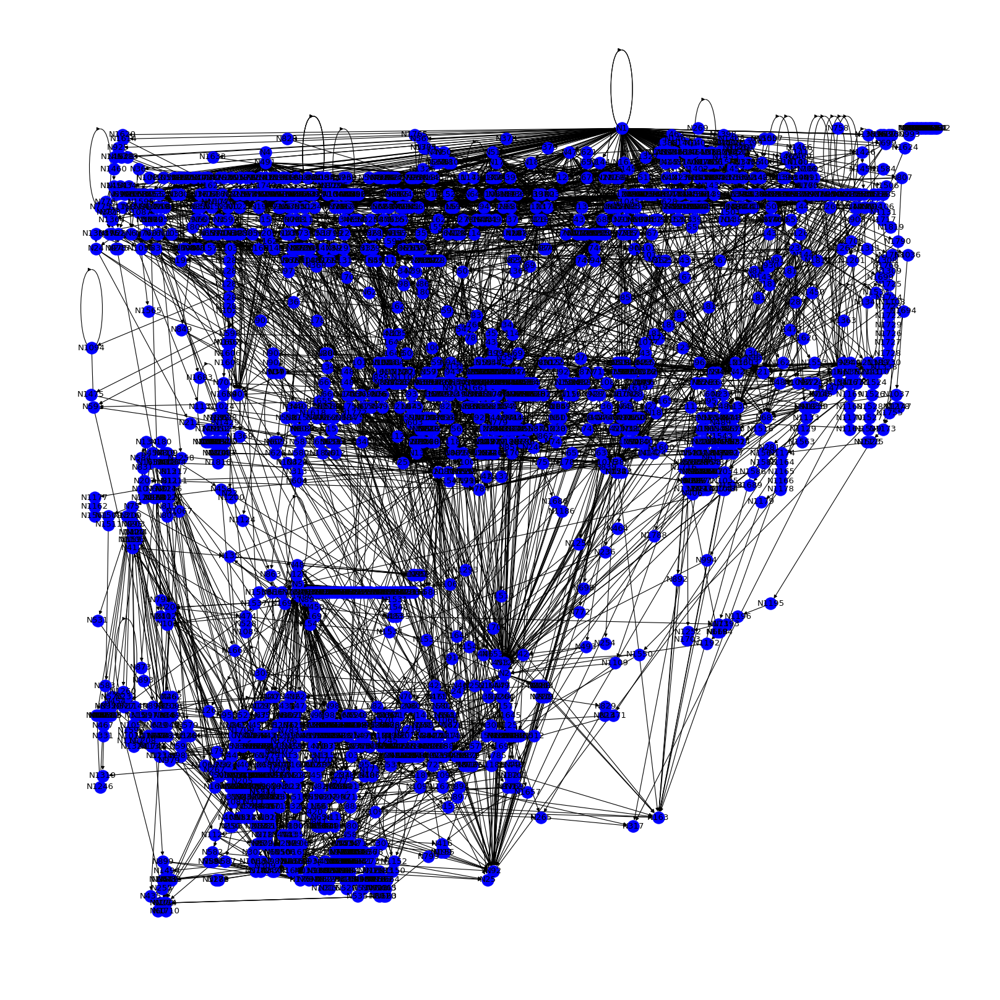

In [136]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(full_graph, pos_full, with_labels=labeldict, arrows=True, node_color="blue")
plt.show()

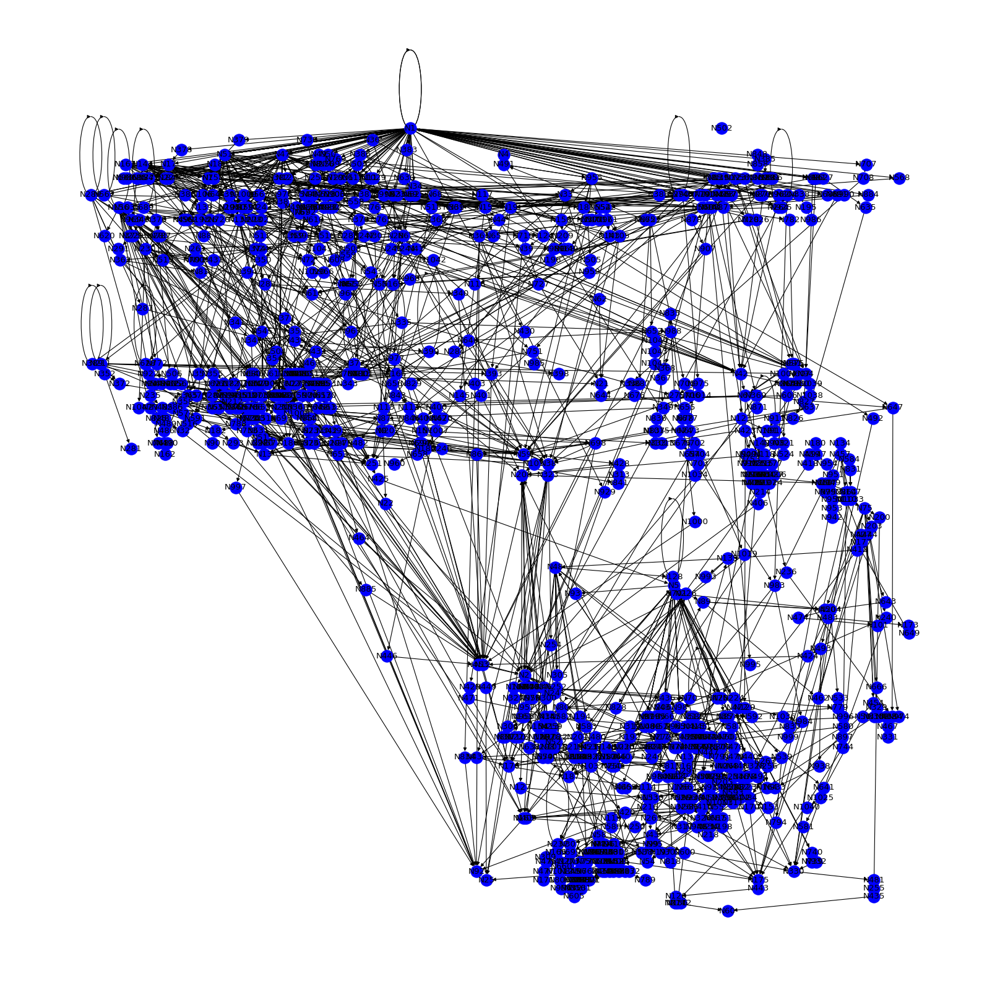

In [73]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(final_graphs[4], pos_full, with_labels=labeldict, arrows=True, node_color="blue")
plt.show()

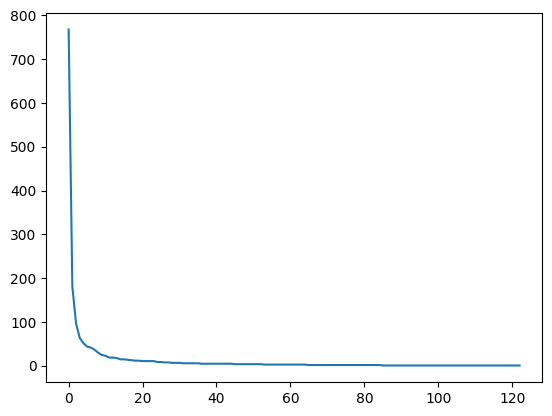

In [140]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
unused_graphs = final_graphs.copy()

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(unused_graphs):  

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        # if overlap == highest_coverage[1] and overlap > 0:
        #     print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = unused_graphs.pop(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

# print(reduce_graphs_nodes)


In [141]:
print(len(final_graphs))
print(len(reduce_graphs_nodes))

188
123


In [142]:
print(reduce_graphs_nodes)

[(58, 768), (150, 181), (136, 97), (76, 64), (24, 52), (21, 44), (12, 42), (98, 37), (160, 30), (0, 25), (174, 23), (59, 19), (60, 19), (60, 18), (96, 15), (160, 15), (13, 14), (79, 13), (30, 12), (67, 12), (105, 11), (112, 11), (135, 11), (152, 11), (57, 9), (107, 9), (16, 8), (147, 8), (75, 7), (125, 7), (139, 7), (73, 6), (81, 6), (108, 6), (132, 6), (152, 6), (14, 5), (39, 5), (71, 5), (75, 5), (90, 5), (90, 5), (95, 5), (103, 5), (131, 5), (29, 4), (40, 4), (53, 4), (68, 4), (88, 4), (91, 4), (112, 4), (123, 4), (16, 3), (29, 3), (31, 3), (59, 3), (61, 3), (62, 3), (70, 3), (75, 3), (86, 3), (96, 3), (97, 3), (105, 3), (4, 2), (4, 2), (13, 2), (22, 2), (22, 2), (35, 2), (36, 2), (40, 2), (42, 2), (55, 2), (58, 2), (63, 2), (71, 2), (80, 2), (81, 2), (87, 2), (87, 2), (91, 2), (98, 2), (100, 2), (0, 1), (1, 1), (1, 1), (3, 1), (3, 1), (6, 1), (10, 1), (12, 1), (15, 1), (15, 1), (16, 1), (20, 1), (23, 1), (25, 1), (28, 1), (37, 1), (37, 1), (37, 1), (38, 1), (42, 1), (42, 1), (44, 1

In [143]:
for idx, name in enumerate(ordered_graphs.keys()):
    if idx not in [x[0] for x in reduce_graphs_nodes]:
        print(name)

05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-10-7-10-10
05-28-2023_BenchmarkNexts-nextmany__50.000000%
05-28-2023_BenchmarkChecksum-checksum-1048576
05-28-2023_BenchmarkNexts-nextmany__25.000000%
05-28-2023_BenchmarkIteratorAlloc-simple_iteration_with_alloc
05-28-2023_BenchmarkShortIteratorNextRuntime-init_size_65535_shortIterator_next
05-28-2023_BenchmarkGetTestBitSet
05-28-2023_BenchmarkChecksum-checksum-512
05-28-2023_BenchmarkSerializationDense
05-28-2023_BenchmarkChecksum-checksum-8192
05-28-2023_BenchmarkInPlaceArrayUnions
05-28-2023_BenchmarkChecksum-checksum-compressed-512
05-28-2023_BenchmarkChecksum-checksum-compressed-262144
05-28-2023_BenchmarkChecksum-checksum-compressed-32
05-28-2023_BenchmarkChecksum-checksum-256
05-28-2023_BenchmarkShortIteratorNextBitmap-init_size_1_shortIterator_next
05-28-2023_BenchmarkChecksum-checksum-compressed-8192
05-28-2023_BenchmarkUnionInPlaceCopyOnWrite-7-10-3-3
05-28-2023_BenchmarkAntagonisticArrayUnionsGrowth
05-28-2023_BenchmarkChecksum-ch

In [245]:
count = 0
for e in full_graph.edges():
    if e[0] == e[1]:
        count += 1
print(f"Self loops: {count}")

Self loops: 16


In [246]:
def get_edge_lists_1d(graph):
    return [e[0] + e[1] for e in graph.edges()]

In [ ]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes = []
remaining_graph = full_graph.copy()
unused_graphs = final_graphs.copy()

while len(remaining_graph.nodes()) > 1:
    
    # Find highest coverage within the unused benchmark graphs
    highest_coverage = (0, 0)
    
    for idx, benchmark_graph in enumerate(unused_graphs):  

        overlap_nodes = np.intersect1d(list(benchmark_graph.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        # if overlap == highest_coverage[1] and overlap > 0:
        #     print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)

    
    # if iterations % 20  == 0:
    #     plt.figure(figsize=(20, 20), dpi=80)
    #     color_map_full = ['blue' if node in remaining_graph.nodes()  else 'green' for node in full_graph.nodes()]
    #     nx.draw(full_graph, pos_full, with_labels=False, arrows=True, node_color=color_map_full)
    #     plt.show()

    if highest_coverage[1] == 0:
        print(f"Failed to find graph with overlap, Remaining: {len(remaining_graph.nodes())}")
        break
    
    reduce_graphs_nodes.append(highest_coverage)
    
    # remove graph from unused graphs and nodes from remaining graph
    used_graph = unused_graphs.pop(highest_coverage[0])
    remaining_graph.remove_nodes_from(used_graph.nodes())

plt.plot([x[1] for x in reduce_graphs_nodes])
plt.show()

print(reduce_graphs_nodes)


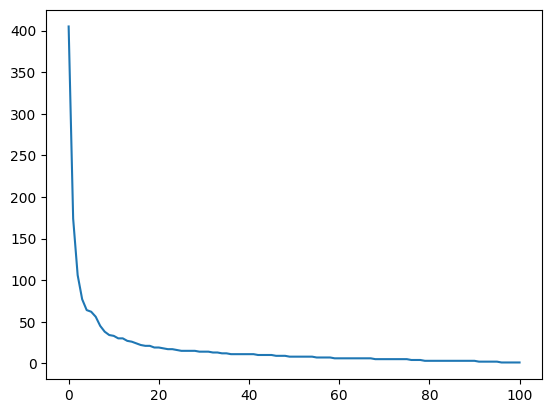

In [247]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_edges = []
remaining_graph = full_graph.copy()
node_overlap = []

while len(remaining_graph.edges()) > 1:
    # get graph with highest coverage
    highest_coverage = (0, 0)
    coverages = []
    for idx, g in enumerate(new_graphs):
        # get overlap with full graph
        overlap_edges = np.intersect1d(get_edge_lists_1d(g), get_edge_lists_1d(remaining_graph))
        overlap = len(overlap_edges)

        if overlap == highest_coverage[1] and overlap > 0:
            #print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")
            pass

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)
            node_overlap.append(overlap)


    if iterations % 20  == 0 and False:
        plt.figure(figsize=(20, 20), dpi=80)
        nx.draw(remaining_graph, pos_full, with_labels=False, arrows=True)
        plt.show()

    
    reduce_graphs_edges.append(highest_coverage)
    remaining_graph.remove_edges_from(new_graphs[highest_coverage[0]].edges())

plt.plot([x[1] for x in reduce_graphs_edges])
plt.show()


In [75]:
# Check if there is a subset of graphs to evaluate reduction potential
for idx1, g1 in enumerate(final_graphs):
    for idx2, g2 in enumerate(final_graphs):
        # check for node overlap
        if idx1 == idx2:
            continue
        
        overlap_nodes = np.intersect1d(list(g1.nodes()), list(g2.nodes()))
        if overlap_nodes.size == len(g1.nodes()) or overlap_nodes.size == len(g2.nodes()):
            print(f"Overlap in nodes: {overlap_nodes.size}, one graph is a subset of the other")

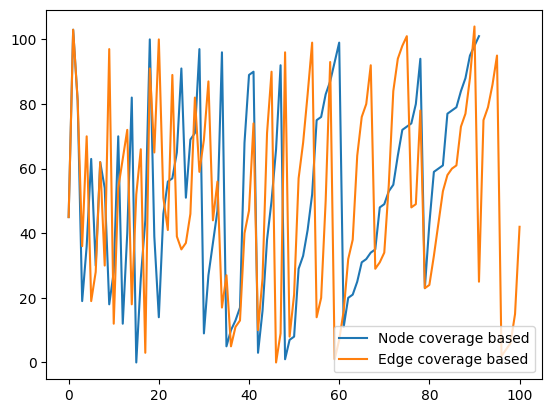

In [249]:
plt.plot([x[0] for x in reduce_graphs_nodes], label="Node coverage based")
plt.plot([x[0] for x in reduce_graphs_edges], label="Edge coverage based")
# plt.plot(node_overlap, label="Edge coverage based node overlap")
plt.legend()

In [250]:
inter = np.intersect1d([x[0] for x in reduce_graphs_nodes], [x[0] for x in reduce_graphs_edges])
len(inter)

92

In [251]:
reduced_new_graphs = new_graphs.copy()
unstable = "BenchmarkMarshal-ReferenceFile-map"
for idx, file in enumerate(dot_files):
    if unstable == get_name_from_dot(file):
        reduced_new_graphs.pop(idx)

No overlap found


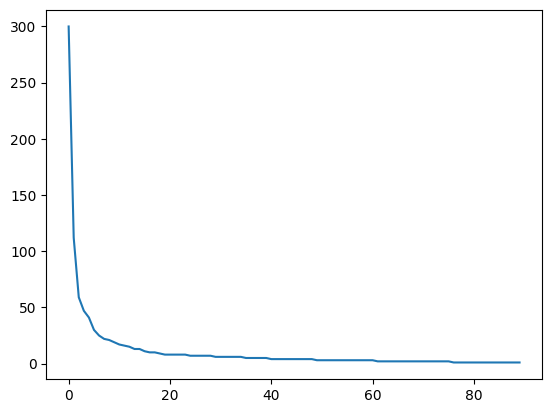

In [252]:
"""Take graphs with highest coverage and remove them from the remaining graphs."""
reduce_graphs_nodes_x = []
highest_coverage: tuple = (0, 0)
remaining_graph = full_graph.copy()
iterations = 0

while len(remaining_graph.nodes()) > 1:
    # get graph with highest coverage
    highest_coverage = (0, 0)
    coverages = []
    for idx, g in enumerate(reduced_new_graphs):
        # get overlap with full graph
        overlap_nodes = np.intersect1d(list(g.nodes()), list(remaining_graph.nodes()))
        overlap = len(overlap_nodes)

        if overlap == highest_coverage[1] and overlap > 0:
            #print(f"Remaining: {len(remaining_graph.nodes())} - Overlap between {idx} and {highest_coverage[0]}: {overlap}")
            pass

        if overlap > highest_coverage[1]:
            highest_coverage = (idx, overlap)

        coverages.append((idx, overlap))
    covs = sorted(coverages, key=itemgetter(1), reverse=True)
    iterations += 1

    if highest_coverage[1] == 0:
        print("No overlap found")
        break
    
    reduce_graphs_nodes_x.append(highest_coverage)
    remaining_graph.remove_nodes_from(reduced_new_graphs[highest_coverage[0]].nodes())

plt.plot([x[1] for x in reduce_graphs_nodes_x])
plt.show()


In [253]:
print(len(reduce_graphs_nodes_x))
print(len(remaining_graph.nodes()))

90
12


In [17]:
[x[1] for x in reduce_graphs_nodes]

NameError: name 'reduce_graphs_nodes' is not defined

In [254]:
inter = np.intersect1d([x[0] for x in reduce_graphs_nodes], [x[0] for x in reduce_graphs_nodes_x])
len(inter)

80

In [255]:
len(reduce_graphs_nodes_x)

90

In [256]:
len(new_graphs)

105

In [257]:
len(full_graph.nodes())

1054

In [258]:
for idx, file in enumerate(dot_files):
    if "BenchmarkMarshal-ReferenceFile-map" in file and "dot" in file:
        print(idx, file)

0 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_2_1_v2-0-1.dot
20 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_3_1_v2-0-1.dot
89 /Users/christopher/Uni/MasterThesis/exp2/instance0/backup-mt-1-instance-0/04-29-2023_BenchmarkMarshal-ReferenceFile-map_1_1_v2-0-1.dot


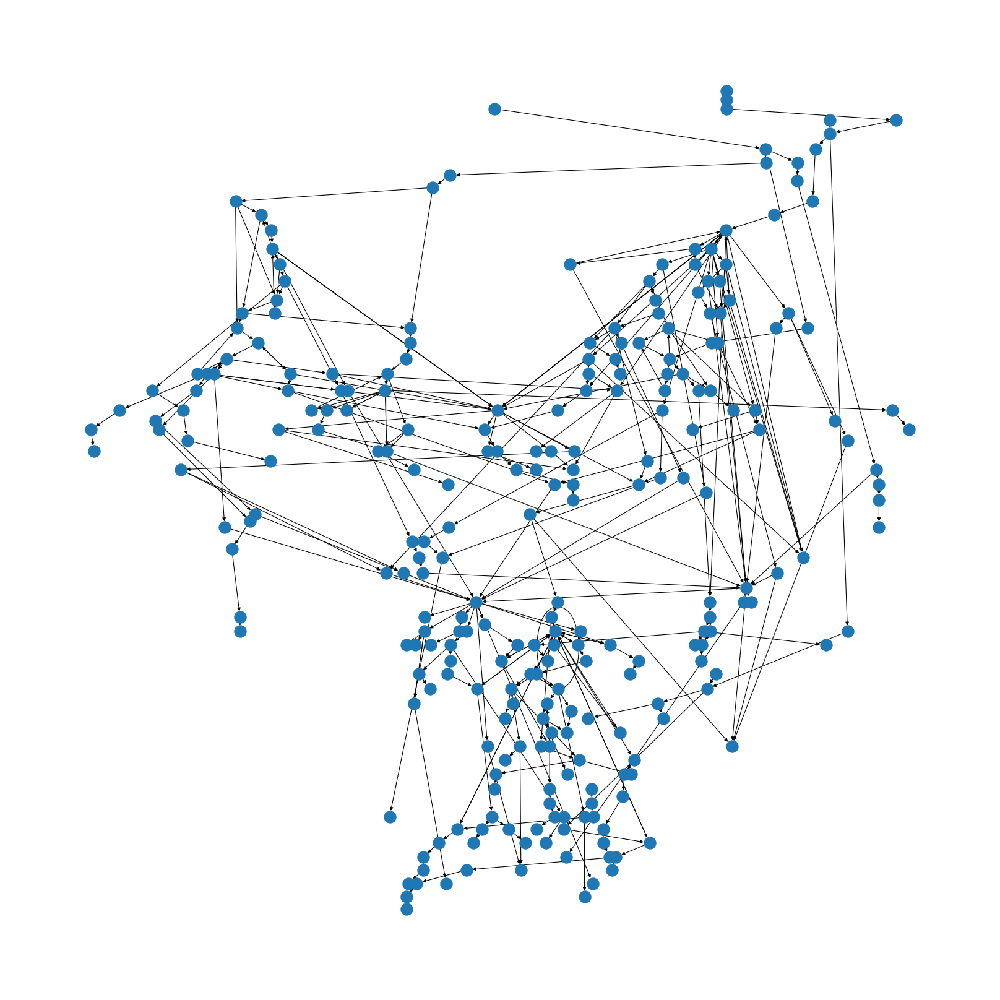

In [259]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[0], pos_full, with_labels=False, arrows=True)

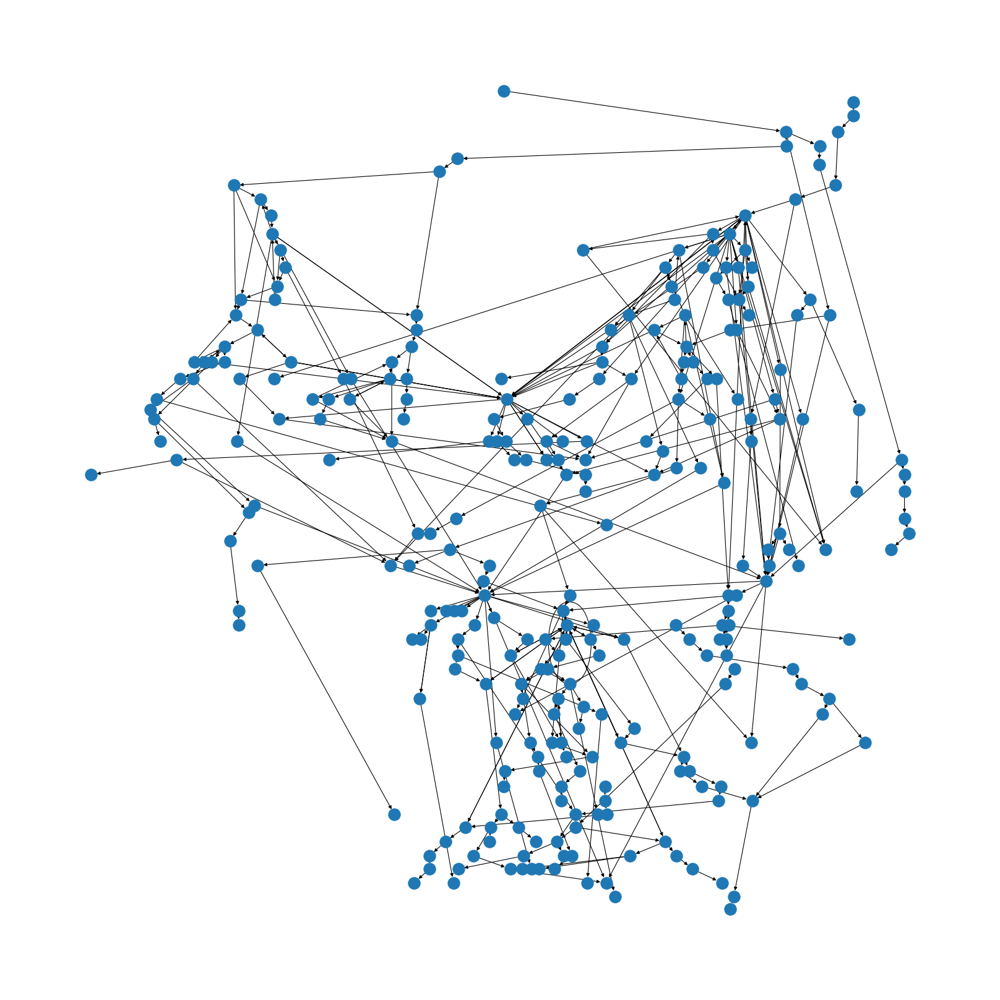

In [260]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[20], pos_full, with_labels=False, arrows=True)

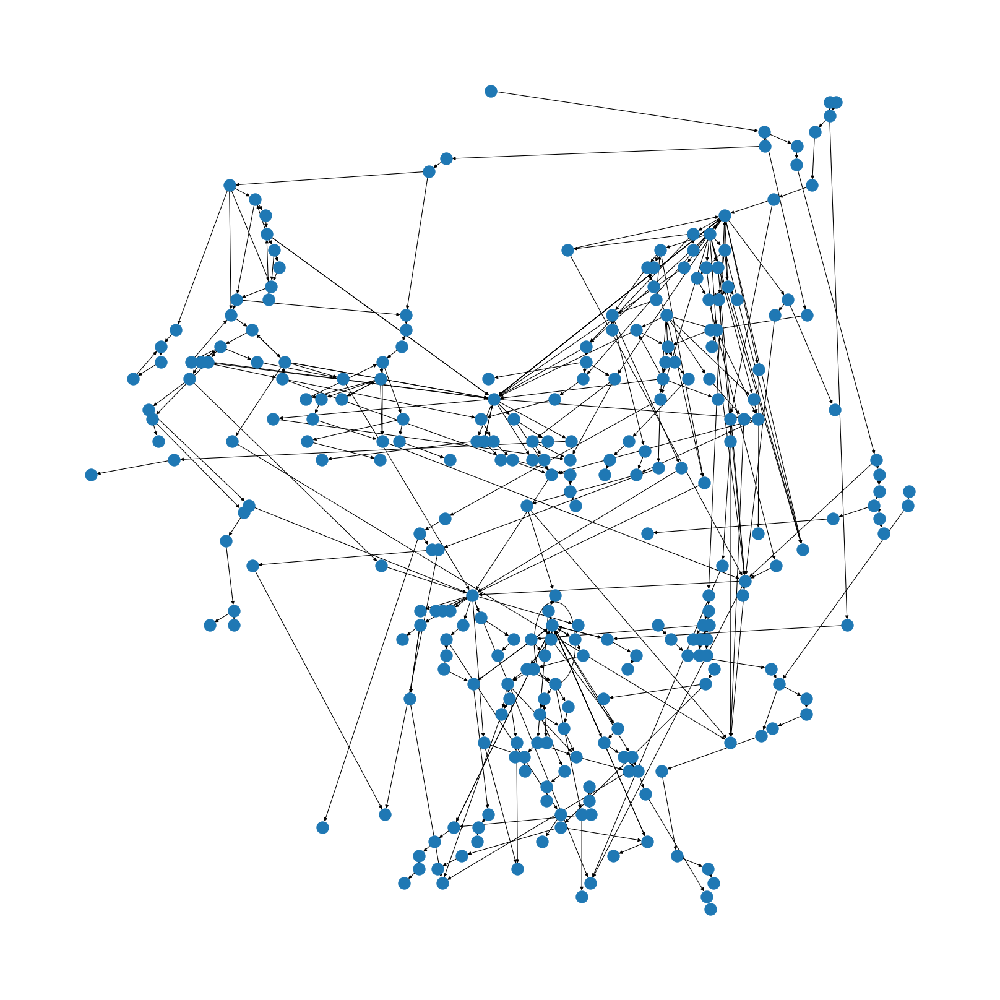

In [261]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(new_graphs[89], pos_full, with_labels=False, arrows=True)

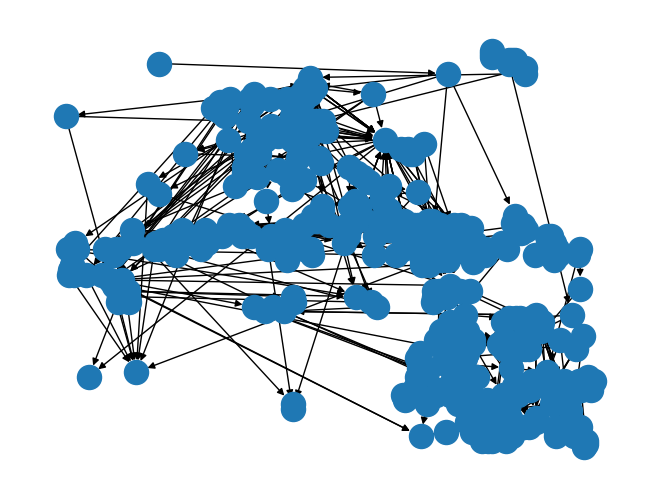

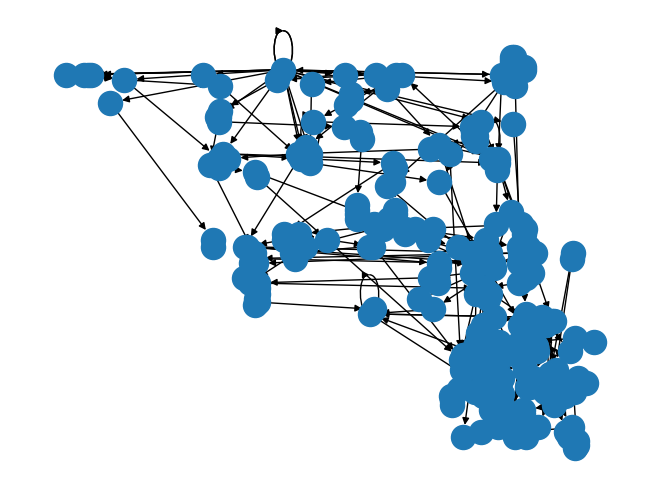

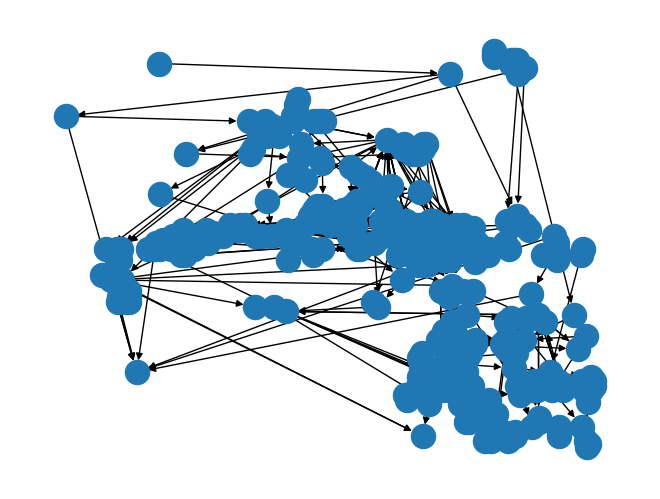

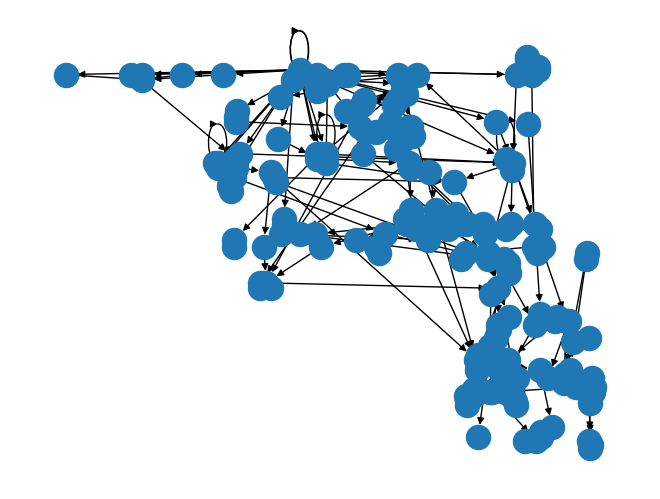

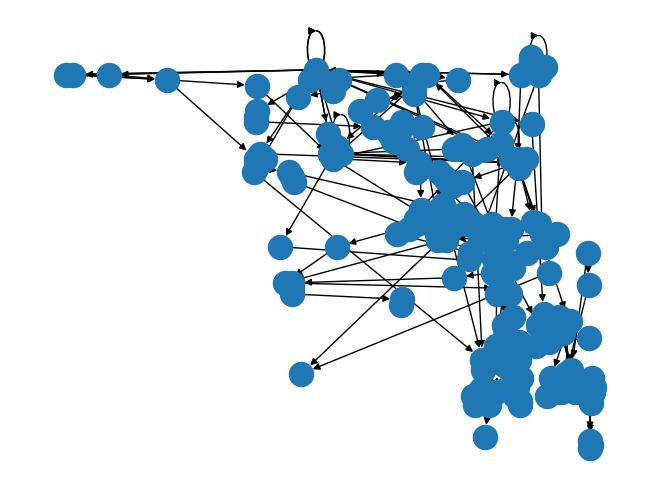

...

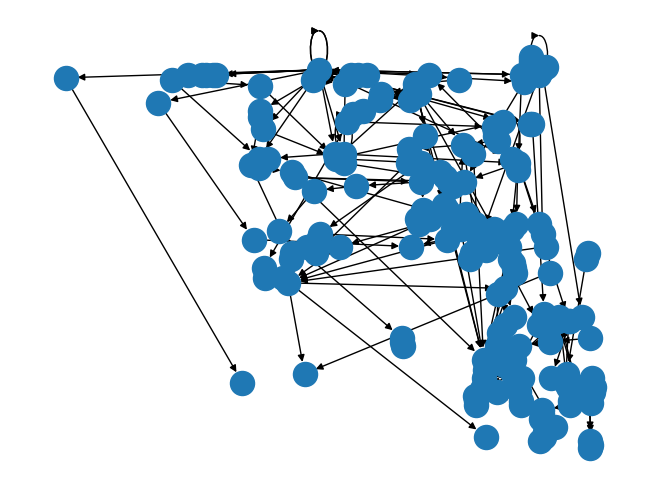

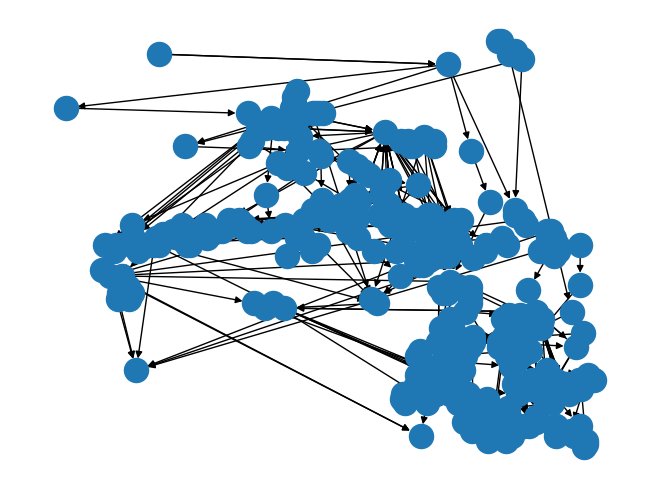

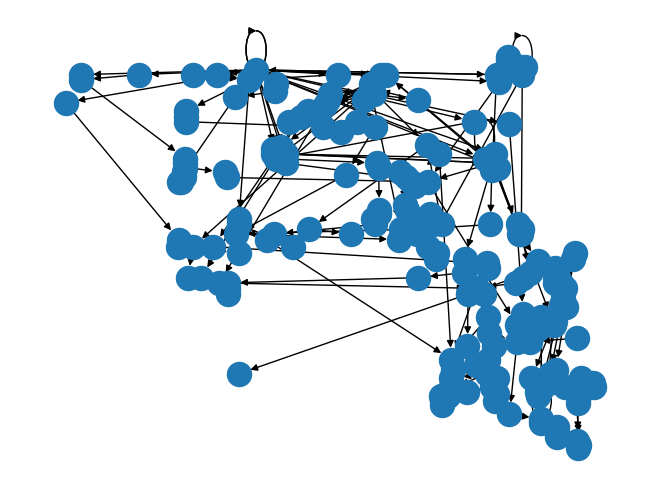

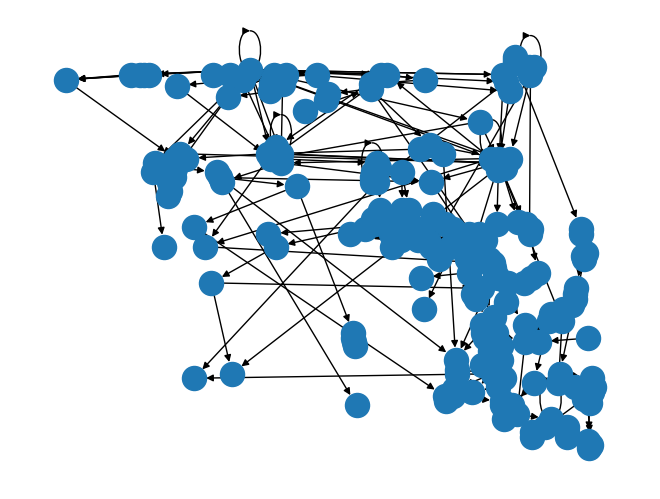

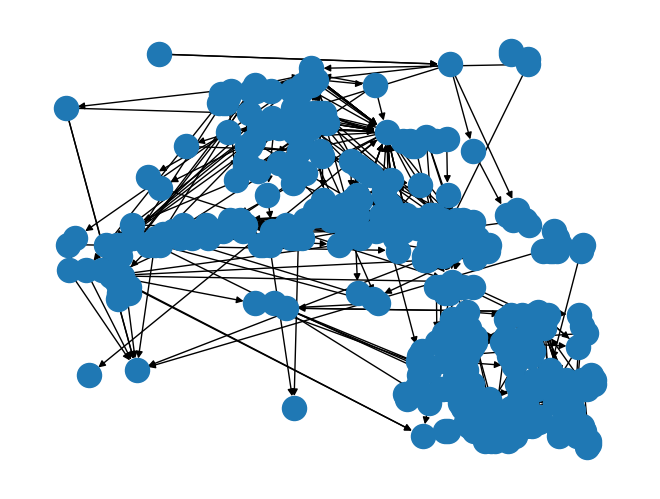

In [15]:
for graph in final_graphs:
    nx.draw(graph, pos_full, with_labels=False, arrows=True)
    plt.show()

In [1]:
final_graphs

NameError: name 'final_graphs' is not defined

In [13]:
for graph in final_graphs:
    